In [2]:
# !pip install --force-reinstall --no-cache-dir --no-deps numpy==1.26.4


In [1]:
!nvidia-smi --query-gpu=name,memory.total,memory.free,driver_version,compute_cap --format=csv
!nvidia-smi | head -n 20

name, memory.total [MiB], memory.free [MiB], driver_version, compute_cap
Tesla T4, 15360 MiB, 14913 MiB, 580.82.07, 7.5
Mon May  4 02:31:42 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   50C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                   

In [1]:
from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = '/content/drive/MyDrive/legato_t4'
import os
for sub in ('datasets', 'outputs', 'downloads'):
    os.makedirs(f'{DRIVE_ROOT}/{sub}', exist_ok=True)
print('Drive root:', DRIVE_ROOT)
!ls -la $DRIVE_ROOT

Mounted at /content/drive
Drive root: /content/drive/MyDrive/legato_t4
total 12
drwx------ 2 root root 4096 May  3 23:42 datasets
drwx------ 2 root root 4096 May  3 23:42 downloads
drwx------ 2 root root 4096 May  3 23:42 outputs


In [2]:
REPO_URL = 'https://github.com/kikisq7/CVProject.git'
%cd /content
!rm -rf legato
!git clone $REPO_URL legato
%cd /content/legato
!git remote -v && echo '----' && git log -1 --oneline

# Symlink heavy dirs to Drive so checkpoints + datasets survive a disconnect.
import os
DRIVE_ROOT = '/content/drive/MyDrive/legato_t4'
for sub in ('datasets', 'outputs', 'downloads'):
    src = f'{DRIVE_ROOT}/{sub}'
    dst = f'/content/legato/{sub}'
    if os.path.lexists(dst):
        !rm -rf $dst
    os.symlink(src, dst)
print('Symlinked outputs/, datasets/, downloads/ -> Drive.')
!ls -la /content/legato | grep -E 'outputs|datasets|downloads'

# Smashcima rendering deps (kept even if we use the augmentation fallback;
# stress-eval and inference still benefit from PIL/cairo).
!apt-get update -qq && apt-get install -y -qq libcairo2 libpango-1.0-0 libpangocairo-1.0-0 fonts-noto-music > /dev/null

# musicdiff is git+ssh upstream; rewrite for Colab (no SSH key)
!sed -i 's|git+ssh://git@github.com/|git+https://github.com/|g' requirements.txt

!pip install -q -r requirements.txt
!pip install -q 'peft>=0.13' 'bitsandbytes>=0.43' 'accelerate>=1.0' omrdatasettools
print('install done')

/content
Cloning into 'legato'...
remote: Enumerating objects: 296, done.
remote: Counting objects: 100% (296/296), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 296 (delta 160), reused 277 (delta 141), pack-reused 0 (from 0)
Receiving objects: 100% (296/296), 585.04 KiB | 5.52 MiB/s, done.
Resolving deltas: 100% (160/160), done.
/content/legato
origin	https://github.com/kikisq7/CVProject.git (fetch)
origin	https://github.com/kikisq7/CVProject.git (push)
----
96a9458 (HEAD -> main, origin/main, origin/HEAD) fix muscima abc pipeline
Symlinked outputs/, datasets/, downloads/ -> Drive.
lrwxrwxrwx 1 root root   41 May  4 11:47 datasets -> /content/drive/MyDrive/legato_t4/datasets
lrwxrwxrwx 1 root root   42 May  4 11:47 downloads -> /content/drive/MyDrive/legato_t4/downloads
lrwxrwxrwx 1 root root   40 May  4 11:47 outputs -> /content/drive/MyDrive/legato_t4/outputs
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinoi

In [3]:
import os
from huggingface_hub import login

try:
    from google.colab import userdata
    token = userdata.get('HF_TOKEN')
except Exception:
    token = os.environ.get('HF_TOKEN')
assert token, 'Set Colab secret HF_TOKEN before running.'
login(token=token)
os.environ['HF_TOKEN'] = token  # so subprocesses (scripts/*) inherit it
print('HF login OK; whoami:')
!huggingface-cli whoami

HF login OK; whoami:
⚠️  Warning: 'huggingface-cli whoami' is deprecated. Use 'hf auth whoami' instead.
shiqicheng
orgs:  ml-virtualmarvin


In [6]:
import numpy
print(numpy.__version__)
print(numpy.__file__)
import datasets
print(datasets.__version__)
from datasets import load_dataset
load_dataset('guangyangmusic/PDMX-Synth', split='train[:1]', token=True)

2.0.2
/usr/local/lib/python3.12/dist-packages/numpy/__init__.py
3.2.0


README.md:   0%|          | 0.00/623 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/39 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/39 [00:00<?, ?it/s]

data/train-00000-of-00039.parquet:   0%|          | 0.00/488M [00:00<?, ?B/s]

data/train-00001-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00002-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00003-of-00039.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00004-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00005-of-00039.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00006-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00007-of-00039.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00008-of-00039.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

data/train-00009-of-00039.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00010-of-00039.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00011-of-00039.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00012-of-00039.parquet:   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00013-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00014-of-00039.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00015-of-00039.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00016-of-00039.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00017-of-00039.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00018-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00019-of-00039.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00020-of-00039.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

data/train-00021-of-00039.parquet:   0%|          | 0.00/507M [00:00<?, ?B/s]

data/train-00022-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00023-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00024-of-00039.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00025-of-00039.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00026-of-00039.parquet:   0%|          | 0.00/488M [00:00<?, ?B/s]

data/train-00027-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00028-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00029-of-00039.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00030-of-00039.parquet:   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00031-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00032-of-00039.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00033-of-00039.parquet:   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00034-of-00039.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

data/train-00035-of-00039.parquet:   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00036-of-00039.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00037-of-00039.parquet:   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00038-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/val-00000-of-00001.parquet:   0%|          | 0.00/69.6M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/69.8M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/214547 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/800 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/800 [00:00<?, ? examples/s]

Dataset({
    features: ['filename', 'image', 'transcription'],
    num_rows: 1
})

In [4]:
from datasets import load_dataset

# Pull only the first 4 rows of train so this is fast.
probe = load_dataset('guangyangmusic/PDMX-Synth', split='train[:4]', token=True)
print('columns:', probe.column_names)
print('features:', probe.features)
row = probe[0]
for k in probe.column_names:
    v = row[k]
    print(f'  {k:>20s}: type={type(v).__name__}, '
          f'len={len(v) if hasattr(v, "__len__") else "n/a"}, '
          f'preview={str(v)[:80]!r}')

README.md:   0%|          | 0.00/623 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/39 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/39 [00:00<?, ?it/s]

data/train-00000-of-00039.parquet:   0%|          | 0.00/488M [00:00<?, ?B/s]

data/train-00001-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00002-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00003-of-00039.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00004-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00005-of-00039.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00006-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00007-of-00039.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00008-of-00039.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

data/train-00009-of-00039.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00010-of-00039.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00011-of-00039.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00012-of-00039.parquet:   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00013-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00014-of-00039.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00015-of-00039.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00016-of-00039.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00017-of-00039.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00018-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00019-of-00039.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00020-of-00039.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

data/train-00021-of-00039.parquet:   0%|          | 0.00/507M [00:00<?, ?B/s]

data/train-00022-of-00039.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00023-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00024-of-00039.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00025-of-00039.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00026-of-00039.parquet:   0%|          | 0.00/488M [00:00<?, ?B/s]

data/train-00027-of-00039.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00028-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00029-of-00039.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00030-of-00039.parquet:   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00031-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00032-of-00039.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00033-of-00039.parquet:   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00034-of-00039.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

data/train-00035-of-00039.parquet:   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00036-of-00039.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00037-of-00039.parquet:   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00038-of-00039.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/val-00000-of-00001.parquet:   0%|          | 0.00/69.6M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/69.8M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/214547 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/800 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/800 [00:00<?, ? examples/s]

columns: ['filename', 'image', 'transcription']
features: {'filename': Value(dtype='string', id=None), 'image': Image(mode=None, decode=True, id=None), 'transcription': Value(dtype='string', id=None)}
              filename: type=str, len=7, preview='5754533'
                 image: type=PngImageFile, len=n/a, preview='<PIL.PngImagePlugin.PngImageFile image mode=RGB size=690x1578 at 0x7E194F3D6A50>'
         transcription: type=str, len=4902, preview='X:1\nT:<|text|>\nC:<|text|>\n%%score [ 1 2 3 4 ]\nL:1/8\nM:3/4\nI:linebreak $\nK:C\nV:1 '


smashcima-hw


In [5]:
%cd /content/legato

import os
if os.path.isdir('datasets/PDMX-SmashcimaHW') and os.listdir('datasets/PDMX-SmashcimaHW'):
    print('PDMX-SmashcimaHW already on Drive, skipping rebuild.')
else:
    !PYTHONPATH=. python scripts/build_handwritten_aug_dataset.py \
        --source_dataset guangyangmusic/PDMX-Synth \
        --source_split_slice 800 \
        --output_dir datasets/PDMX-SmashcimaHW \
        --max_train 500 --max_val 50 --max_test 100 \
        --images_per_source 1 \
        --mini_val_size 30 --mini_test_size 80

from datasets import load_from_disk
smash = load_from_disk('datasets/PDMX-SmashcimaHW')
print('PDMX-SmashcimaHW splits:', {k: len(v) for k, v in smash.items()})
print('sample columns:', smash['train'].column_names)

/content/legato
PDMX-SmashcimaHW already on Drive, skipping rebuild.
PDMX-SmashcimaHW splits: {'train': 500, 'val': 50, 'test': 100}
sample columns: ['filename', 'transcription', 'musicxml', 'image']


filename: 5754533_aug0
---- transcription (first 400 chars) ----
X:1
T:<|text|>
C:<|text|>
%%score [ 1 2 3 4 ]
L:1/8
M:3/4
I:linebreak $
K:C
V:1 treble nm=<|text|> snm=<|text|>
V:2 treble nm=<|text|> snm=<|text|>
V:3 treble-8 transpose=-12 nm=<|text|> snm=<|text|>
V:4 bass nm=<|text|> snm=<|text|>
V:1
 c2 | G4 e2 | (d/e/f/d/ c2) B2 | c4 e2 | (d2 c2) B2 | %5
w: <|text|>|<|text|> <|text|>|<|text|> * * * * <|text|>|<|text|> <|text|>|<|text|> * <|text|>|
w: <|text| ...


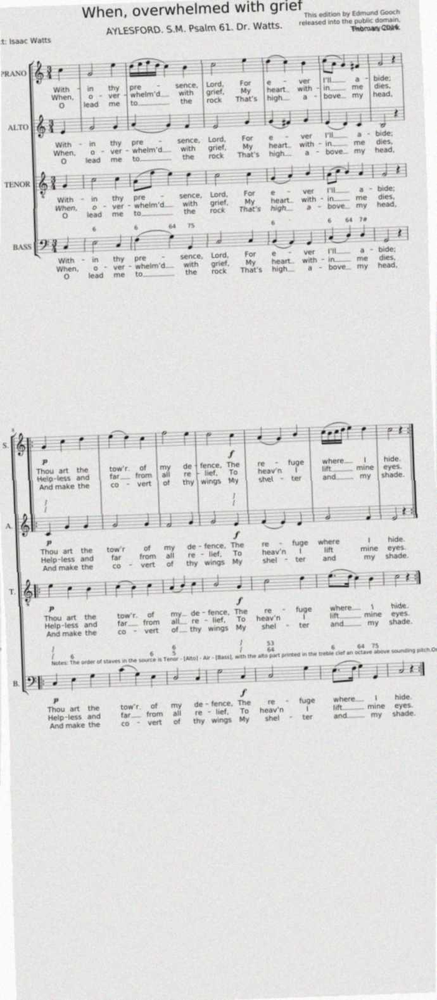

In [6]:
# Quick visual sanity check.
from datasets import load_from_disk
from IPython.display import display

smash = load_from_disk('datasets/PDMX-SmashcimaHW')
ex = smash['train'][0]
print('filename:', ex['filename'])
print('---- transcription (first 400 chars) ----')
print(ex['transcription'][:400], '...')
display(ex['image'])

In [7]:
%cd /content/legato
import os
if os.path.isdir('datasets/stress') and os.listdir('datasets/stress'):
    print('Stress sets already on Drive, skipping rebuild.')
else:
    !PYTHONPATH=. python scripts/build_stress_eval.py \
        --source_dataset datasets/PDMX-SmashcimaHW \
        --split test --max_samples 60 \
        --out_root datasets/stress

from datasets import load_from_disk
for cond in sorted(os.listdir('datasets/stress')):
    d = load_from_disk(f'datasets/stress/{cond}')
    splits = {k: len(v) for k, v in d.items()}
    print(f'  stress/{cond:<10s}: {splits}')

/content/legato
Stress sets already on Drive, skipping rebuild.
  stress/blur      : {'test': 60}
  stress/clean     : {'test': 60}
  stress/downscale : {'test': 60}
  stress/jpeg      : {'test': 60}
  stress/noise     : {'test': 60}
  stress/rotate    : {'test': 60}


**blur** -- 60 samples, showing index 0:

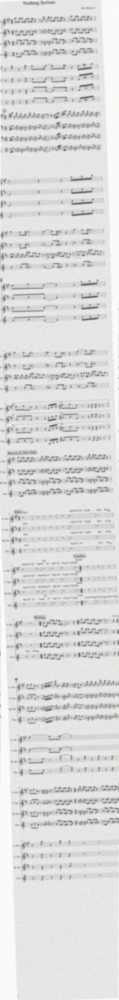

**clean** -- 60 samples, showing index 0:

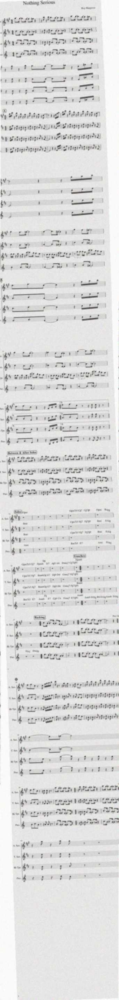

**downscale** -- 60 samples, showing index 0:

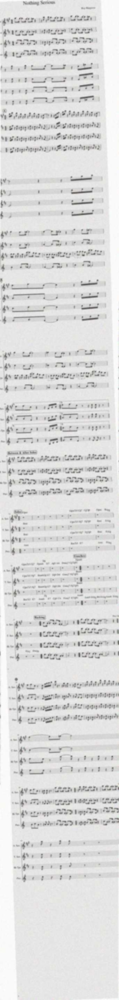

**jpeg** -- 60 samples, showing index 0:

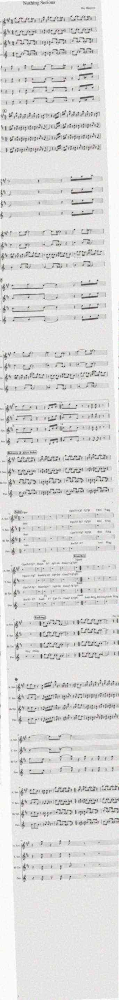

**noise** -- 60 samples, showing index 0:

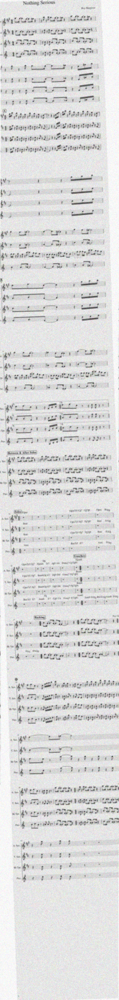

**rotate** -- 60 samples, showing index 0:

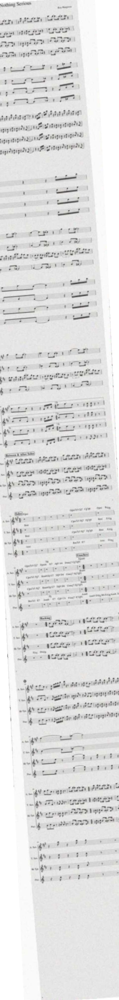

In [8]:
# Visualize one rendered page under each perturbation.
from datasets import load_from_disk
from IPython.display import display, Markdown
import os
for cond in sorted(os.listdir('datasets/stress')):
    d = load_from_disk(f'datasets/stress/{cond}')['test']
    display(Markdown(f'**{cond}** -- {len(d)} samples, showing index 0:'))
    img = d[0]['image']
    display(img.resize((480, int(480 * img.height / img.width))))

In [9]:
%cd /content/legato
import os, json
from datasets import load_dataset, DatasetDict

if os.path.isdir('datasets/PDMX-Synth') and os.listdir('datasets/PDMX-Synth'):
    print('PDMX-Synth slice already cached on Drive.')
else:
    print('Downloading PDMX-Synth (test[:200]) ...')
    test_slice = load_dataset('guangyangmusic/PDMX-Synth', split='test[:200]', token=True)
    DatasetDict({'test': test_slice}).save_to_disk('datasets/PDMX-Synth')

from datasets import load_from_disk
pdmx = load_from_disk('datasets/PDMX-Synth')
print('PDMX-Synth splits:', {k: len(v) for k, v in pdmx.items()})
names = list(pdmx['test']['filename'])[:80]
with open('datasets/mini_test.json', 'w') as f:
    json.dump(names, f)
print('mini_test.json size =', len(names))

/content/legato
PDMX-Synth slice already cached on Drive.
PDMX-Synth splits: {'test': 200}
mini_test.json size = 80


In [23]:
# %cd /content/legato
# !git checkout -- requirements.txt
# !git pull

/content/legato
Updating 96a9458..1cc41f1
Fast-forward
 requirements.txt                 |   4 +
 scripts/build_muscima_dataset.py | 368 ++++++++++++++++++++++++++++++++++++++-
 scripts/train.py                 |  10 +-
 3 files changed, 376 insertions(+), 6 deletions(-)


In [24]:
%cd /content/legato
import json
import os
import shutil
import subprocess

# MuNG→music21→MuseScore→ABC needs MuseScore on the VM:
!apt-get update -qq && apt-get install -y -qq musescore3 > /dev/null

MUSICXML_DIR = None  # optional e.g. 'downloads/muscima_mxml'

mpp = 'datasets/MUSCIMA-pp'
man_path = os.path.join(mpp, 'manifest.json')
need_build = True
if os.path.isdir(mpp) and os.listdir(mpp):
    if os.path.isfile(man_path):
        with open(man_path, encoding='utf-8') as f:
            man = json.load(f)
        ntx = man.get('non_empty_transcription_count', 0)
        if ntx > 0:
            need_build = False
            print('MUSCIMA-pp already has ABC references; skipping rebuild.')
        else:
            print('MUSCIMA-pp had zero transcriptions; wiping and rebuilding with MuNG v2...')
            shutil.rmtree(mpp)
    else:
        print('Legacy MUSCIMA-pp (no manifest); wiping for MuNG-based rebuild.')
        shutil.rmtree(mpp)

if need_build:
    cmd = [
        'python', 'scripts/build_muscima_dataset.py',
        '--auto_download',
        '--download_dir', 'downloads/muscima_pp',
        '--output_dir', 'datasets/MUSCIMA-pp',
        '--max_samples', '30',
    ]
    if MUSICXML_DIR and os.path.isdir(MUSICXML_DIR):
        cmd.extend(['--musicxml_dir', MUSICXML_DIR])
    subprocess.run(cmd, check=True, env={**os.environ, 'PYTHONPATH': '.'})

from datasets import load_from_disk
muscima = load_from_disk('datasets/MUSCIMA-pp')
print('MUSCIMA-pp splits:', {k: len(v) for k, v in muscima.items()})
print('columns:', muscima['test'].column_names)
nonempty_tx = sum(1 for t in muscima['test']['transcription'] if t)
print('non-empty transcription (ABC):', nonempty_tx, '/', len(muscima['test']))

/content/legato
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
MUSCIMA-pp splits: {'test': 30}
columns: ['filename', 'transcription', 'musicxml', 'image']
non-empty transcription (ABC): 30 / 30


In [25]:
# Save 6 MUSCIMA++ pages to disk for scripts/inference.py to iterate.
import os
from datasets import load_from_disk
os.makedirs('downloads/muscima_sample', exist_ok=True)
muscima = load_from_disk('datasets/MUSCIMA-pp')['test']
n = min(6, len(muscima))
for i in range(n):
    ex = muscima[i]
    out = f'downloads/muscima_sample/{ex["filename"] or f"page_{i:03d}"}.png'
    ex['image'].convert('RGB').save(out)
print(f'Wrote {n} MUSCIMA++ pages to downloads/muscima_sample/')
!ls downloads/muscima_sample

Wrote 6 MUSCIMA++ pages to downloads/muscima_sample/
CVC-MUSCIMA_W-01_N-10_D-ideal.png  CVC-MUSCIMA_W-02_N-06_D-ideal.png
CVC-MUSCIMA_W-01_N-14_D-ideal.png  CVC-MUSCIMA_W-02_N-13_D-ideal.png
CVC-MUSCIMA_W-01_N-19_D-ideal.png  CVC-MUSCIMA_W-02_N-17_D-ideal.png


##  Zero-shot baseline across structured conditions (don't rerun)

In [26]:
%cd /content/legato
!git pull
!PYTHONPATH=. python scripts/eval_legato_t4.py \
    --run_tag legato-baseline-t4 \
    --adapter_path '' \
    --conditions eval_muscima \
    --generation_max_length 768 --generation_num_beams 1

/content/legato
Already up to date.

$ python scripts/train.py outputs/legato-baseline-t4/eval_muscima/predict_config.json
2026-05-04 12:52:53.260012: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 12:52:53.328344: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Loading checkpoint shards: 100% 5/5 [00:02<00:00,  2.42it/s]
Map (num_proc=2): 100% 30/30 [00:00<00:00, 135.52 examples/s]
predict:   0% 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/bitsandbytes/autograd/_functions.py:391: UserWarning:

In [40]:
%cd /content/legato
!git pull
!PYTHONPATH=. python scripts/eval_legato_t4.py \
    --run_tag legato-baseline-t4 \
    --adapter_path '' \
    --generation_max_length 768 --generation_num_beams 1

/content/legato
Already up to date.

$ python scripts/train.py outputs/legato-baseline-t4/eval_smashcima_clean/predict_config.json
2026-05-04 16:51:11.038759: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 16:51:11.107284: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Loading checkpoint shards: 100% 5/5 [00:02<00:00,  2.47it/s]
predict:   0% 0/60 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/bitsandbytes/autograd/_functions.py:391: UserWarning: Some matrices hidden dimension is not a multiple of 6

In [27]:
import pandas as pd
print('\nBaseline summary:')
print(pd.read_csv('outputs/legato-baseline-t4/summary.csv').to_string(index=False))


Baseline summary:
   condition        SER       CER
eval_muscima 453.255426 347.04311


In [28]:
%cd /content/legato
!PYTHONPATH=. python scripts/inference.py \
    --model_path guangyangmusic/legato-small \
    --image_path downloads/muscima_sample \
    --load_in_4bit --fp16 \
    --beam_size 1 --max_length 768 \
    --max_images 6 \
    --output_path outputs/muscima_baseline.json \
    --print_predictions

/content/legato
2026-05-04 13:01:17.906845: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 13:01:17.974371: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Loading checkpoint shards: 100% 5/5 [00:02<00:00,  2.49it/s]
Predicting...:   0% 0/6 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/bitsandbytes/autograd/_functions.py:391: UserWarning: Some matrices hidden dimension is not a multiple of 64 and efficient inference kernels are not supported for these (slow). Matrix input size found: torch.Size([1, 

In [32]:
%cd /content/legato
!git pull
import os
os.environ['PYTHONPATH'] = '.'
os.environ['WANDB_DISABLED'] = 'true'
os.environ['BITSANDBYTES_NOWELCOME'] = '1'
!python scripts/train.py configs/legato-dlora-t4.json


/content/legato
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0 (from 0)
Unpacking objects: 100% (4/4), 344 bytes | 344.00 KiB/s, done.
From https://github.com/kikisq7/CVProject
   b084e5f..cbfc7fa  main       -> origin/main
Updating b084e5f..cbfc7fa
Fast-forward
 scripts/train.py | 3 ++-
 1 file changed, 2 insertions(+), 1 deletion(-)
2026-05-04 13:24:55.712510: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 13:24:55.780663: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: A

In [33]:
# Print what the trainer wrote (it's on Drive via the symlink).
import os, json
out = 'outputs/legato-dlora-t4'
print('Files in', out, ':')
if os.path.isdir(out):
    for f in sorted(os.listdir(out)):
        p = os.path.join(out, f)
        sz = os.path.getsize(p) if os.path.isfile(p) else None
        print(f'  {f}  ({sz} bytes)' if sz is not None else f'  {f}/')
ts = os.path.join(out, 'trainer_state.json')
if os.path.isfile(ts):
    state = json.load(open(ts))
    print('\nfinal global_step:', state.get('global_step'))
    print('final epoch:      ', state.get('epoch'))
    last_eval = [r for r in state.get('log_history', []) if 'eval_SER' in r]
    if last_eval:
        print('last eval row:    ', last_eval[-1])
print('\nDrive copy:')
!ls -la /content/drive/MyDrive/legato_t4/outputs/legato-dlora-t4 2>/dev/null | head -n 30

Files in outputs/legato-dlora-t4 :
  README.md  (5178 bytes)
  checkpoint-300/
  checkpoint-500/
  decoder_lora/
  eval_muscima/
  eval_pdmx/
  eval_smashcima_blur/
  eval_smashcima_clean/
  eval_smashcima_downscale/
  eval_smashcima_full/
  eval_smashcima_jpeg/
  eval_smashcima_noise/
  eval_smashcima_rotate/
  preprocessor_config.json  (477 bytes)
  special_tokens_map.json  (493 bytes)
  summary.csv  (208 bytes)
  tokenizer.json  (261343 bytes)
  tokenizer_config.json  (1634 bytes)
  vision_dora/

Drive copy:
total 317
drwx------ 4 root root   4096 May  4 14:27 checkpoint-300
drwx------ 4 root root   4096 May  4 15:09 checkpoint-500
drwx------ 2 root root   4096 May  4 15:13 decoder_lora
drwx------ 2 root root   4096 May  4 00:30 eval_muscima
drwx------ 2 root root   4096 May  4 00:30 eval_pdmx
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_blur
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_clean
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_downsca

In [34]:
%cd /content/legato
!PYTHONPATH=. python scripts/eval_legato_t4.py \
    --run_tag legato-dlora-t4 \
    --adapter_path outputs/legato-dlora-t4 \
    --generation_max_length 768 --generation_num_beams 1

import pandas as pd
print('\nFine-tuned summary:')
print(pd.read_csv('outputs/legato-dlora-t4/summary.csv').to_string(index=False))

/content/legato

$ python scripts/train.py outputs/legato-dlora-t4/eval_smashcima_clean/predict_config.json
2026-05-04 15:13:46.610704: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 15:13:46.677542: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Loading checkpoint shards: 100% 5/5 [00:02<00:00,  2.45it/s]
Using auto half precision backend
No label_names provided for model class `PeftModel`. Since `PeftModel` hides base models input arguments, if label_names is not given, label_names can't be set automatical

## MUSCIMA++ -- fine-tuned qualitative inference

In [35]:
%cd /content/legato
!PYTHONPATH=. python scripts/inference.py \
    --model_path guangyangmusic/legato-small \
    --peft_adapter_path outputs/legato-dlora-t4 \
    --image_path downloads/muscima_sample \
    --load_in_4bit --fp16 \
    --beam_size 1 --max_length 768 \
    --max_images 6 \
    --output_path outputs/muscima_dlora.json \
    --print_predictions

/content/legato
2026-05-04 16:46:49.278902: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-04 16:46:49.346561: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Loading checkpoint shards: 100% 5/5 [00:02<00:00,  2.46it/s]
[inference] loaded PEFT adapters from outputs/legato-dlora-t4
Predicting...:   0% 0/6 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/bitsandbytes/autograd/_functions.py:391: UserWarning: Some matrices hidden dimension is not a multiple of 64 and efficient inference kernels are not suppor

### MUSCIMA++ page 1: `CVC-MUSCIMA_W-01_N-10_D-ideal.png`

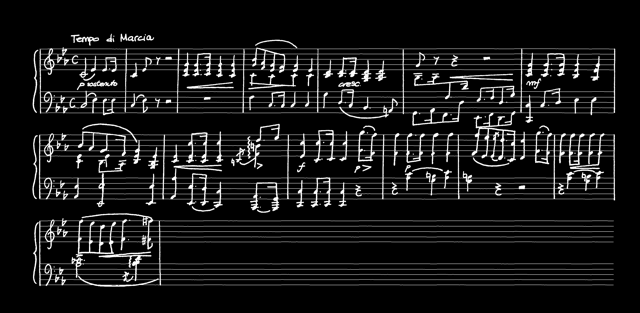

**baseline (zero-shot legato-small) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | ( 3 4 ) }
L:1/8
M:4/4
I:linebreak $
K:Eb
V:1 treble nm="<|text|>"
V:2 treble
V:3 bass
V:4 bass
V:1
"<|text|>"!p! E2 E2 z4 | C2 C z z4 |!<(! [CEA]>[CEA] [CEA]2!<)!!>(! [CEA]2 [CEA]2!>)! | [CE]2 [CE][A,C] [G,B,_D]4 |$ z2 z2 z4 | %5
 [CEA]2 [CE][A,CE] [B,EG]2 [B,EG]2 |$ ([EG]/[EG]/[EG]/)[FA]/ ([GB]/[Ac]/)[AB]/[Ac]/ [Bd]2 [GB]2 | [EGB]2 [A,=DF_A][A,B,DF] [E,G,B,E]2 [G,B,E_G=A=d]>[A,B,^DF] |:$ z8 |] %9
V:2
 (7:8:6(E2 E) E2 z4 | x8 | x2[I:staff +1] C/C/[I:staff -1]C/C/C/ x4 | x8 |$ (7:8:6(B,2 B,) B,2 z4 | %5
 x8 |$ x8 | x8 |:$ (7:8:6(E2 E) E2 z4 |] %9
V:3
 (7:8:6(E,2 E,2) E,2 z4 | (7:8:6(E,2 E, E,2 z4 | A,2 A,A,/B,/) A,2 G,2 | (7:8:6(A,2 A,)A, E,2 E,4 |$ (7:8:6(B,,2 B,, B,,2 B,,2 B,,2 B,,2) | %5
 (7:8:6(E,2 E, E,2 z4 |$ A,2 A,A,/B,/-B,D) B,2 | (7:8:6(B,2 B, B,2


**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | ( 3 4 ) }
L:1/8
M:4/4
I:linebreak $
K:Eb
V:1 treble nm="<|text|>" snm=<|text|>
V:2 treble
V:3 bass
V:4 bass
V:1
!p!"<|text|>" (C2 D2) E2 z2 | C2 D z z4 |!<(! [EGc][EGc][CEG][CEG]!<)! [CEG]2!f! [CE]2 | [A,C]2 [A,C][A,C] [G,B,]3 [G,B,] |$!<(! [A,C][A,C] C!<)!C!>(! C2!>)!!mf! [CE]2 | %5
w: <|text|> * *|||||
 [CE]>[A,CE] [A,CE]2 [B,D]4 |!<(! [Cc][Cc] [Cc]/[Cc]/[Cc] [Cc]2!<)!!f! [Cc]/[Cc]/ | [Cc][Cc]/[Cc]/ [Cc]2 [B,B]2 |] %8
w: |||
V:2
"<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>""<|text|>"


---

### MUSCIMA++ page 2: `CVC-MUSCIMA_W-01_N-14_D-ideal.png`

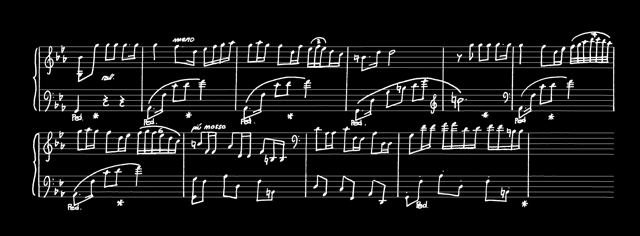

**baseline (zero-shot legato-small) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | 3 }
L:1/8
M:4/4
I:linebreak $
K:C
V:1 treble nm="<|text|>"
V:2 treble
V:3 bass
V:1
 E2 A2 B2 B>c | d2 d>c Bd c2 | B2 B2 z4 | A8 |$ E2 A2 B2 B>c | %5
w: <|text|> * * * *|||||
 d2 dc Bd c2 | B2 B2 z4 | A8[Q:1/4=98][Q:1/4=97][Q:1/4=95][Q:1/4=94][Q:1/4=92][Q:1/4=91][Q:1/4=89][Q:1/4=88][Q:1/4=86][Q:1/4=84][Q:1/4=83][Q:1/4=81][Q:1/4=80][Q:1/4=78][Q:1/4=77][Q:1/4=75][Q:1/4=74][Q:1/4=73][Q:1/4=72][Q:1/4=70][Q:1/4=69][Q:1/4=68][Q:1/4=65][Q:1/4=66][Q:1/4=65][Q:1/4=60][Q:1/4=55][Q:1/4=60][Q:1/4=50][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:1/4=40][Q:


**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | 3 }
L:1/8
M:4/4
I:linebreak $
K:C
V:1 treble nm="<|text|>"
V:2 treble
V:3 bass
V:1
 E2 A2 B2 B>c | d2 d>c Bd c2 | AA A2 AA G2 | A8 |$ A2 A2 A2 A>B | %5
 c2 c2 c2 c2 | A2 A2 AB c2 |[M:31/32] (3:2:9Tc3/2-c/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4 z/4


---

### MUSCIMA++ page 3: `CVC-MUSCIMA_W-01_N-19_D-ideal.png`

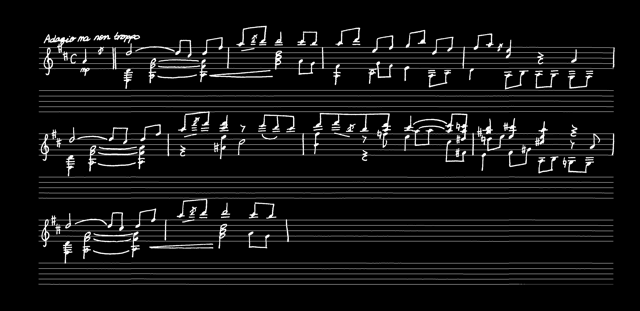

**baseline (zero-shot legato-small) ABC:**

X:1
T:<|text|>
%%score ( 1 2 )
L:1/8
M:4/4
I:linebreak $
K:C
V:1 treble nm="<|text|>"
V:2 treble
V:1
 G2 z2 z4 |] z2 dd z2 df | a^c'd'd' c'2 c'd' | gb gb z2 dc' |$ z2 z g a2 z2 | %5
 z2 z g a2 z2 |$ z2 z g a2 z2 |1 d'e'f'^a' ^c''^c'' ^c''^c'' ||$[K:D] z8 | z8 |$ %10
 z8 | z8 |$ z8 | z8 |] %14
V:2
 [cc]4 [Ac]4 |] [C-A]2 [C-A]2- [C-A]2 [C-A]2 | [C-A]2 [C-A]2- [C-A]2 [C-A]2 | [CB-]2 [B,-G]2 [B,C]2 [B,D]-[A,B,^D] |$ C z z [ce]- [ce]2 z [ce]/[Bd]/- | %5
 [GB][^C^G]-[CE]/[K:bass]A,/[K:treble]^C/ z/ [^CE]/[K:bass]A,/ z/ [^F,A,]/^G,/ z/ [^F,A,]/ |$ [G,-^A,]2 [G,-A,]2 [G,A,]4 |1 [^C,E,]4 A,4 ||$[K:D] z8 | z8 |$ %10
 z8 | z8 |$ z8 |] %13



**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
T:<|text|>
%%score ( 1 2 )
L:1/8
M:4/4
I:linebreak $
K:C
V:1 treble nm="<|text|>"
V:2 treble
V:1
 G2 z2 z4 |] z2 dd z2 fa- | a^c'd'd' bb gb- | gb ^Ac z2 z2 |$ z2 gg z2 ga | %5
 g2 z2 z4 |$ z2 dd z2 fa |: a>d' z c'/d'/ c'e' d'b | d'd'-d'd' b^c'b^a |$[K:D] b2 ^a2 b4 | %10
 ^d^d- d/d/g f^b-f'b |] %11
V:2
 [cc]4 [GBd]4- |] [G-B]4 [G-B]2 [GB]2- | [G-B]4 [G-c]2 [GB]2- | [G-B]4 [G-B]2 [GB]2- |$ [GB]4- [G-B]2 [GB]2- | %5
 [G-B]4 [G-c]2 [GB]2- |$ [G-B]4 [G-c]2 [GB]2- |: [GB]4 [Bd]4 | [Bd]4 [ce]4 |$[K:D] (3A,B,C ^A,=A, z A, z A, | %10
 [G,B,]4 [B,D]4 |] %11



---

### MUSCIMA++ page 4: `CVC-MUSCIMA_W-02_N-06_D-ideal.png`

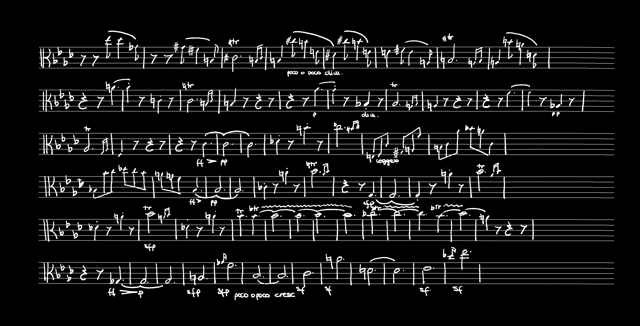

**baseline (zero-shot legato-small) ABC:**

X:1
T:<|text|>
%%score ( 1 2 )
L:1/8
M:4/4
I:linebreak $
K:C
V:1 perc nm="<|text|>" snm="<|text|>"
K:none
V:2 perc
K:none
V:1
 z z/!f! [Ac]/ | z2 z2 z4 | z8 | z8 | z8 | %5
w: |||||
 z8 | z8 | z8 | z8 | z8 | %10
w: |||||
 z8 | z8 | z8 | z8 | z8 | %15
w: |||||
 z8 | z8 | z8 | z8 | z8 | %20
w: |||||
 z8 | z8 | z8 | z8 | z8 | %25
w: |||||
 z8 | z8 | z8 | z8 | z8 | %30
w: |||||
 z8 | z8 | z8 | z8 | z8 | %35
w: |||||
 z8 | z8 | z8 | z8 | z8 | %40
w: |||||
 z8 | z8 | z8 | z8 | z8 | %45
w: |||||
 z8 | z8 | z8 | z8 | z8 | %50
w: |||||
 z8 | z8 | z8 | z8 | z8 | %55
w: |||||
 z8 | z8 | z8 | z8 | z8 | %60
w: |||||
 z8 | z8 | z8 | z8 | z8 | %65
w: |||||
 z8 | z8 | z8 | z8 | z8 | %70
w: |||||
 z8 | z8 | z8 | z8 | z8 | %75
w: |||||
 z8 | z8 | z8 | z8 | z8 | %80
w: |||||
 z8 | z8 | z8 | z8 | z8 | %85
w: |


**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
T:<|text|>
%%score ( 1 2 )
L:1/8
M:4/4
I:linebreak $
K:C
V:1 perc nm="<|text|>" snm="<|text|>"
K:none
V:2 perc
K:none
V:1
 z z/!f! f/ | z2 z/ f/^f z/ f^^f z/ f^^f | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d |$ z2 z/ ^b/^a z/ b^^f^d | %5
 z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d |$ z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | %10
 z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d |$ z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | %15
 z2 z/ ^b/^a z/ b^^f^d |$ z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d |$ %20
 z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d |$ z2 z/ ^b/^a z/ b^^f^d | %25
 z2 z/ ^b/^a z/ b^^f^d | z2 z/ ^b/^a z/ b^^f^d | z


---

### MUSCIMA++ page 5: `CVC-MUSCIMA_W-02_N-13_D-ideal.png`

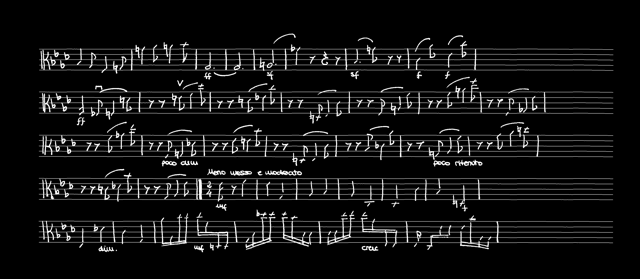

**baseline (zero-shot legato-small) ABC:**

X:1
L:1/8
M:none
I:linebreak $
K:C
V:1 perc
K:none
V:1
 A2 B z/ B/ |] [c=f]2 [cg]/[_cf]/ | [Ac]6 | [C_E]3 (7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7z/ s[Bd]/[f_a]/[d_f]/) z/ z2 |:$ [ce]/[B_d]/ z/ (7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:"<|text|>"(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:7(7:4:":4x/(7:9:1" s[E_G]/)) [EG]/ [GB]/ [GB]/ [GB]/ [GB]/ [GB]/ [GB]/ [GB]/ [GB


**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
L:1/8
M:2/8
I:linebreak $
K:Eb
V:1 perc
K:none
V:1
 A2 B =G/G/ ||[K:C] g/ z/ b/ |[M:4/4]"<|text|>" (7:4:7(TC7/2) F3/4 | (7:2:9z/6 sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz2 s!tenuto!uB4 |$ (7:2:9z/6 sz sz sz sz sz sz sz sz sz sz sz sz sz sz2 sue | %5
w: |||||
 (7:4:6sTD8 sE7/4E/4E/4 z/4 z sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz sz


---

### MUSCIMA++ page 6: `CVC-MUSCIMA_W-02_N-17_D-ideal.png`

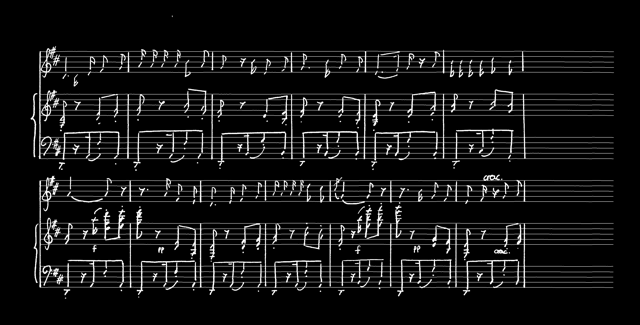

**baseline (zero-shot legato-small) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | ( 3 4 ) } 5 6 7 8 9 10 11
L:1/8
M:4/4
I:linebreak $
K:D
V:1 treble nm="<|text|>"
V:2 treble
V:3 treble
V:4 treble
V:5 treble
V:6 treble transpose=12 nm=<|text|>
V:7 treble transpose="8]"""!f! z B | [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] | [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] | [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] [Ac] | %5
 [Bd] [ce] [df] [eg] [fa]/ [gb]/ [fa]/ [eg]/ [df]/ |$ [ce]/[Bd]/[Ac]/[GB]/ [FA]/[EG]/[DF]/[CE]/[DF]/ [EG]/[DF]/[CE]/[DF]/ [EG]/[FA]/[GB]/[FA]/ | [FA]/[GB]/[FA]/[GB]/ [FA]/[EG]/[DF]/[CE]/[DF]/ [EG]/[DF]/[CE]/[DF]/ [EG]/[DF]/[CE]/[DF]/ | [DF]2 z2 z4 |] %9
V:2
 z2 z/ | z2 z/ | z2 z/ | z2 z/ | z2 z/ | %5
 z2 z/ |$ z2 z/ | z2 z/ | z2 z/ |] %9
V:3
 z2 z/ | z2 z/ | z2 z/ | z2 z/ | z2 z/ | %5
 z2 z/ |$ z2 z/ | z2 z/ | z2 z/ |] %9
V:4
 z2 z/ | z2 z/ | z2 z/ 


**fine-tuned (DLoRA on Smashcima HW) ABC:**

X:1
T:<|text|>
%%score { ( 1 2 ) | 3 } ( 4 5 6 7 )
L:1/8
M:4/4
I:linebreak $
K:D
V:1 treble nm="<|text|>"
V:2 treble
V:3 treble
V:4 bass nm="<|text|>"
V:5 bass
V:6 bass
V:7 bass
V:1
 D3/2 E/ F3/2 G/ A/ z/ B/ c/ z/ B/ A/^G/ | A/ z/ A/ A/-E/ D/ || [CE]3/2[DF]/ | [EG]3/2[FA]/ | [GB]2 [Ac]4 |$ %5
 z [_Ac]/ | [Bd]3/2 z/ [Bd]/ |] [Ac]2 z2 z2 z2 | [Ac]2 z2 z2 z2 | [Ac]2 z2 z2 z2 | %10
 [Ac]2 z2 z2 z2 |] %11
V:2
 x7/2 .D/ x4 | x7/2 || x3/2 | x3/2 | x11/2 |$ %5
 x7/2 |: x3 |] x8 | x8 | x8 | %10
 x8 |] %11
V:3
 x7/2 .D/ x4 | x7/2 || x3/2 | x3/2 | x11/2 |$ %5
 x7/2 |] x5/2 |] x8 | x8 | x8 | %10
 x8 |] %11
V:4
 D,,3/2-[D,,B,,]/16 z2 z/ D,,/-D,,/ z2 | F,,3/2-F,,3/8 z2 z/ B,,/4-B,,/ || D,3/2.D,/ | G,,3/4 z/4 z/ | G,,3/2-G,,/8 z/8 z2 z/ D,/8-D,/8 z/8 z2 |$ %5
 F,,3/2-F,,3/8 z2 z/ B,,/4-B,,/ |] D,3/2.D,/ 


---

In [36]:
import json, os
from IPython.display import display, Markdown
from PIL import Image

base = json.load(open('outputs/muscima_baseline.json'))
ft   = json.load(open('outputs/muscima_dlora.json'))
image_dir = 'downloads/muscima_sample'
image_files = sorted(f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg')))

for i, fname in enumerate(image_files[:len(base['abc_transcription'])]):
    display(Markdown(f'### MUSCIMA++ page {i+1}: `{fname}`'))
    img = Image.open(os.path.join(image_dir, fname)).convert('RGB')
    display(img.resize((640, int(640 * img.height / img.width))))
    display(Markdown('**baseline (zero-shot legato-small) ABC:**'))
    print(base['abc_transcription'][i][:800])
    display(Markdown('**fine-tuned (DLoRA on Smashcima HW) ABC:**'))
    print(ft['abc_transcription'][i][:800])
    display(Markdown('---'))

In [41]:
import pandas as pd
base = pd.read_csv('outputs/legato-baseline-t4/summary.csv').rename(columns={'SER':'SER_baseline','CER':'CER_baseline'})
ft   = pd.read_csv('outputs/legato-dlora-t4/summary.csv').rename(columns={'SER':'SER_dlora','CER':'CER_dlora'})
merged = base.merge(ft, on='condition', how='outer')
merged['SER_delta'] = merged['SER_dlora'] - merged['SER_baseline']
merged['CER_delta'] = merged['CER_dlora'] - merged['CER_baseline']
merged.to_csv('outputs/results_t4.csv', index=False)
print('=== HEADLINE RESULTS TABLE ===')
print(merged.to_string(index=False, float_format=lambda x: f'{x:.4f}'))

=== HEADLINE RESULTS TABLE ===
               condition  SER_baseline  CER_baseline  SER_dlora  CER_dlora  SER_delta  CER_delta
            eval_muscima      453.2554      347.0431   453.8994   332.3047     0.6439   -14.7384
               eval_pdmx       21.4218       19.1959    21.4651    19.1024     0.0433    -0.0935
     eval_smashcima_blur       65.4230       60.2224    64.5953    61.6560    -0.8277     1.4336
    eval_smashcima_clean       60.3372       57.1955    59.1402    55.7345    -1.1970    -1.4610
eval_smashcima_downscale       67.4069       63.4489    60.2633    56.1234    -7.1436    -7.3255
     eval_smashcima_full       56.4064       52.1080    54.8001    51.2858    -1.6063    -0.8222
     eval_smashcima_jpeg       61.0070       57.5947    59.5630    56.3230    -1.4440    -1.2717
    eval_smashcima_noise       62.5809       57.8958    60.2659    55.5908    -2.3150    -2.3050
   eval_smashcima_rotate       62.0104       57.9938    62.3058    61.0071     0.2954     3.0132

In [42]:
from IPython.display import display, Markdown
rows = merged.to_dict(orient='records')
lines = ['| condition | SER (baseline) | SER (DLoRA) | dSER | CER (baseline) | CER (DLoRA) | dCER |',
         '|---|---|---|---|---|---|---|']
def f(v):
    return f'{v:.4f}' if isinstance(v, float) and v == v else '-'
for r in rows:
    lines.append('| {condition} | {sb} | {sf} | {sd} | {cb} | {cf} | {cd} |'.format(
        condition=r['condition'],
        sb=f(r.get('SER_baseline')), sf=f(r.get('SER_dlora')), sd=f(r.get('SER_delta')),
        cb=f(r.get('CER_baseline')), cf=f(r.get('CER_dlora')), cd=f(r.get('CER_delta')),
    ))
display(Markdown('\n'.join(lines)))
print('Plus MUSCIMA++ qualitative inference on 6 real handwritten pages above.')

| condition | SER (baseline) | SER (DLoRA) | dSER | CER (baseline) | CER (DLoRA) | dCER |
|---|---|---|---|---|---|---|
| eval_muscima | 453.2554 | 453.8994 | 0.6439 | 347.0431 | 332.3047 | -14.7384 |
| eval_pdmx | 21.4218 | 21.4651 | 0.0433 | 19.1959 | 19.1024 | -0.0935 |
| eval_smashcima_blur | 65.4230 | 64.5953 | -0.8277 | 60.2224 | 61.6560 | 1.4336 |
| eval_smashcima_clean | 60.3372 | 59.1402 | -1.1970 | 57.1955 | 55.7345 | -1.4610 |
| eval_smashcima_downscale | 67.4069 | 60.2633 | -7.1436 | 63.4489 | 56.1234 | -7.3255 |
| eval_smashcima_full | 56.4064 | 54.8001 | -1.6063 | 52.1080 | 51.2858 | -0.8222 |
| eval_smashcima_jpeg | 61.0070 | 59.5630 | -1.4440 | 57.5947 | 56.3230 | -1.2717 |
| eval_smashcima_noise | 62.5809 | 60.2659 | -2.3150 | 57.8958 | 55.5908 | -2.3050 |
| eval_smashcima_rotate | 62.0104 | 62.3058 | 0.2954 | 57.9938 | 61.0071 | 3.0132 |

Plus MUSCIMA++ qualitative inference on 6 real handwritten pages above.


In [43]:
import shutil, os
snap = '/content/drive/MyDrive/legato_t4/snapshot'
os.makedirs(snap, exist_ok=True)
for src in [
    'outputs/results_t4.csv',
    'outputs/muscima_baseline.json',
    'outputs/muscima_dlora.json',
    'outputs/legato-baseline-t4/summary.csv',
    'outputs/legato-dlora-t4/summary.csv',
]:
    if os.path.isfile(src):
        dst = os.path.join(snap, src.replace('/', '__'))
        shutil.copy(src, dst)
        print('snapshot:', dst)
print('\nAdapter directory (already on Drive via symlink):')
!ls /content/drive/MyDrive/legato_t4/outputs/legato-dlora-t4 2>/dev/null

snapshot: /content/drive/MyDrive/legato_t4/snapshot/outputs__results_t4.csv
snapshot: /content/drive/MyDrive/legato_t4/snapshot/outputs__muscima_baseline.json
snapshot: /content/drive/MyDrive/legato_t4/snapshot/outputs__muscima_dlora.json
snapshot: /content/drive/MyDrive/legato_t4/snapshot/outputs__legato-baseline-t4__summary.csv
snapshot: /content/drive/MyDrive/legato_t4/snapshot/outputs__legato-dlora-t4__summary.csv

Adapter directory (already on Drive via symlink):
checkpoint-300	      eval_smashcima_downscale	special_tokens_map.json
checkpoint-500	      eval_smashcima_full	summary.csv
decoder_lora	      eval_smashcima_jpeg	tokenizer_config.json
eval_muscima	      eval_smashcima_noise	tokenizer.json
eval_pdmx	      eval_smashcima_rotate	vision_dora
eval_smashcima_blur   preprocessor_config.json
eval_smashcima_clean  README.md


#TRY AGAIN


In [1]:
%cd /content
!git clone https://github.com/kikisq7/CVProject.git
%cd /content/legato
!pip install -r requirements.txt

/content
fatal: destination path 'CVProject' already exists and is not an empty directory.
/content/legato
  Cloning https://github.com/guang-yng/efficient-musicdiff.git to /tmp/pip-install-jam6igat/musicdiff_032563896fad441098954fbeec8fb2ce
  Running command git clone --filter=blob:none --quiet https://github.com/guang-yng/efficient-musicdiff.git /tmp/pip-install-jam6igat/musicdiff_032563896fad441098954fbeec8fb2ce
  Resolved https://github.com/guang-yng/efficient-musicdiff.git to commit 3d21fe869ebb1b8ba28e05a457f881d86bb5bb62
  Preparing metadata (setup.py) ... done


In [2]:
%cd /content/legato

# One-time patch in the cloned repo
!sed -i 's|git+ssh://git@github.com/|git+https://github.com/|g' requirements.txt

!pip install -r requirements.txt

/content/legato
  Cloning https://github.com/guang-yng/efficient-musicdiff.git to /tmp/pip-install-pl0k05nk/musicdiff_dae34cec071948fbacaf623103bf1eee
  Running command git clone --filter=blob:none --quiet https://github.com/guang-yng/efficient-musicdiff.git /tmp/pip-install-pl0k05nk/musicdiff_dae34cec071948fbacaf623103bf1eee
  Resolved https://github.com/guang-yng/efficient-musicdiff.git to commit 3d21fe869ebb1b8ba28e05a457f881d86bb5bb62
  Preparing metadata (setup.py) ... done


In [3]:
%cd /content/legato

# Absolute path on Drive (edit if your Drive layout differs)
DRIVE_ROOT = '/content/drive/MyDrive/legato_t4'
DRIVE_ADAPTER = f'{DRIVE_ROOT}/outputs/legato-dlora-t4'
# Uncomment to evaluate the SER-best checkpoint from training logs instead of the root folder:
# DRIVE_ADAPTER = f'{DRIVE_ROOT}/outputs/legato-dlora-t4/checkpoint-300'

import os
print('Adapter path exists:', os.path.isdir(DRIVE_ADAPTER))
!ls -la {DRIVE_ADAPTER} 2>/dev/null | head -n 25

print('\n--- Example: multi-condition eval (explicit Drive adapter) ---')
print(f'''PYTHONPATH=. python scripts/eval_legato_t4.py \\
  --run_tag legato-dlora-t4 \\
  --adapter_path {DRIVE_ADAPTER} \\
  --generation_max_length 768 --generation_num_beams 1''')

print('\n--- Example: inference.py ---')
print(f'''--peft_adapter_path {DRIVE_ADAPTER}''')

print('\n--- Resume training: set in JSON resume_from_checkpoint, e.g. ---')
print(f'"{DRIVE_ADAPTER}/checkpoint-300"')
print('(Or outputs/legato-dlora-t4/checkpoint-300 if symlinks are in place.)')

/content/legato
Adapter path exists: True
total 317
drwx------ 2 root root   4096 May  4 14:27 checkpoint-300
drwx------ 2 root root   4096 May  4 15:09 checkpoint-500
drwx------ 2 root root   4096 May  4 15:13 decoder_lora
drwx------ 2 root root   4096 May  4 00:30 eval_muscima
drwx------ 2 root root   4096 May  4 00:30 eval_pdmx
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_blur
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_clean
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_downscale
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_full
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_jpeg
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_noise
drwx------ 2 root root   4096 May  4 00:30 eval_smashcima_rotate
-rw------- 1 root root    477 May  4 15:13 preprocessor_config.json
-rw------- 1 root root   5178 May  4 15:13 README.md
-rw------- 1 root root    493 May  4 15:13 special_tokens_map.json
-rw------- 1 root root    372

In [9]:
!pip install -q python-Levenshtein

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.3/153.3 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 54.3 MB/s eta 0:00:00


In [4]:
%cd /content/legato
!PYTHONPATH=. python scripts/train.py configs/legato-dlora-t4.json

/content/legato
2026-05-06 03:58:05.725492: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-06 03:58:05.789359: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/content/legato/scripts/train.py", line 402, in <module>
    main()
  File "/content/legato/scripts/train.py", line 57, in main
    dataset = load_from_disk(data_args.dataset_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/datasets/load.py", line 2207, in 